# XAI Evaluation: Grad-CAM, Integrated Gradients, RISE

**Objectives:**
- Evaluate ResNet-18 classification model with multiple XAI methods
- Generate saliency maps: Grad-CAM, Grad-CAM++, IG (3 baselines), RISE
- Compute faithfulness metrics: Insertion/Deletion AUC, Pointing Game, Saliency IoU
- Statistical comparison + sanity checks (randomization test)
- Visualize results on 25 stratified test samples

In [1]:
# Imports
import sys
sys.path.append('..')

import torch
import torch.nn.functional as F
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from PIL import Image
import json
from tqdm.auto import tqdm
from scipy.stats import wilcoxon

from src.models.cls_resnet18 import ResNet18Classifier, LightningClsModel
from src.xai.grad_cam import GradCAM, GradCAMPlusPlus, get_cls_target_layer
from src.xai.integrated_gradients import IntegratedGradientsExplainer
from src.xai.rise import RISE
from src.xai.faithfulness import (
    evaluate_faithfulness,
    insertion_deletion_curves,
    randomization_test
)
from src.losses import FocalLoss
from src.transforms.ultrasound import get_val_transforms
from src.utils import seed_everything, to_binary_mask, compute_lesion_area

%matplotlib inline
sns.set_style('whitegrid')

# Set seed for reproducibility
seed_everything(42)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

/Users/theomoura/.pyenv/versions/3.11.9/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Using device: cpu


## 1. Load Trained Classification Model

In [2]:
# Load checkpoint
checkpoint_path = '../outputs/cls_resnet18/fold_0/best.ckpt'

# Need to pass model and loss_fn explicitly (excluded from hparams)
base_model = ResNet18Classifier(num_classes=2, pretrained=False)
loss_fn = FocalLoss(gamma=1.5)

model = LightningClsModel.load_from_checkpoint(
    checkpoint_path,
    model=base_model,
    loss_fn=loss_fn
)
model = model.to(device)
model.eval()

print(f"✓ Loaded model from {checkpoint_path}")
print(f"✓ Model on {next(model.parameters()).device}")

✓ Loaded model from ../outputs/cls_resnet18/fold_0/best.ckpt
✓ Model on cpu


## 2. Load Data Splits and Select Test Samples

Strategy: Select 25 samples from fold_0 val set, stratified by:
- Class (14 malignant, 11 benign)
- Prediction correctness (balance correct/incorrect)
- Lesion size (small/medium/large quintiles)

In [3]:
# Load data splits
with open('../data_splits.json', 'r') as f:
    splits = json.load(f)

metadata = splits['metadata']
test_indices = splits['folds']['fold_0']['val_indices']  # Using fold_0 val as test

print(f"Test set size: {len(test_indices)} samples")

# Extract test samples metadata
test_samples = [metadata[i] for i in test_indices]
test_df = pd.DataFrame(test_samples)
test_df['class'] = test_df['class'].str.strip()
test_df['class_norm'] = test_df['class'].str.lower()
test_df['class'] = test_df['class'].str.title()

print("\nTest set distribution:")
print(test_df['class'].value_counts())
print("\nLesion area quintiles:")
print(test_df['area_quintile'].value_counts().sort_index())

Test set size: 163 samples

Test set distribution:
class
Malignant    91
Benign       72
Name: count, dtype: int64

Lesion area quintiles:
area_quintile
0    34
1    32
2    32
3    32
4    33
Name: count, dtype: int64


In [4]:
# Get predictions for all test samples
transform = get_val_transforms(img_size=256)

predictions = []
with torch.no_grad():
    for sample in tqdm(test_samples, desc="Computing predictions"):
        img = Image.open(sample['image_path']).convert('RGB')
        img_tensor = transform(image=np.array(img))['image'].unsqueeze(0).to(device)
        
        logits = model(img_tensor)
        pred_class = torch.argmax(logits, dim=1).item()
        predictions.append(pred_class)

test_df['pred_class'] = predictions
test_df['correct'] = test_df['class_label'] == test_df['pred_class']

print(f"\nTest accuracy: {test_df['correct'].mean():.3f}")
print(f"Correct predictions: {test_df['correct'].sum()} / {len(test_df)}")

Computing predictions: 100%|██████████| 163/163 [00:01<00:00, 89.48it/s]


Test accuracy: 0.767
Correct predictions: 125 / 163


In [5]:
# Stratified selection: 25 samples
# 14 malignant (7 correct, 7 incorrect if possible), 11 benign (6 correct, 5 incorrect)
# Balance across lesion sizes

selected_samples = []

cls = test_df['class_norm']

# Malignant: 7 correct, 7 incorrect
mal_correct = test_df[(cls == 'malignant') & (test_df['correct'])]
mal_incorrect = test_df[(cls == 'malignant') & (~test_df['correct'])]

n_mal_correct = min(7, len(mal_correct))
n_mal_incorrect = min(7, len(mal_incorrect))

selected_samples.extend(mal_correct.sample(n=n_mal_correct, random_state=42).index.tolist())
selected_samples.extend(mal_incorrect.sample(n=n_mal_incorrect, random_state=42).index.tolist())

# Benign: 6 correct, 5 incorrect
ben_correct = test_df[(cls == 'benign') & (test_df['correct'])]
ben_incorrect = test_df[(cls == 'benign') & (~test_df['correct'])]

n_ben_correct = min(6, len(ben_correct))
n_ben_incorrect = min(5, len(ben_incorrect))

selected_samples.extend(ben_correct.sample(n=n_ben_correct, random_state=42).index.tolist())
selected_samples.extend(ben_incorrect.sample(n=n_ben_incorrect, random_state=42).index.tolist())

selected_df = test_df.loc[selected_samples].reset_index(drop=True)

if len(selected_df) == 0:
    raise ValueError("No samples selected. Verify class labels/predictions before proceeding.")

print(f"\n✓ Selected {len(selected_df)} samples")
print("\nDistribution:")
print(selected_df.groupby(['class', 'correct']).size())
print("\nArea quintiles:")
print(selected_df['area_quintile'].value_counts().sort_index())


✓ Selected 25 samples

Distribution:
class      correct
Benign     False      5
           True       6
Malignant  False      7
           True       7
dtype: int64

Area quintiles:
area_quintile
0    5
1    3
2    4
3    8
4    5
Name: count, dtype: int64


## 3. Initialize XAI Methods

Methods:
- **Grad-CAM**: Gradient-weighted Class Activation Mapping
- **Grad-CAM++**: Improved localization with weighted gradients
- **Integrated Gradients**: 3 baselines (black, mean, blur)
- **RISE**: Black-box method with 400 random masks

In [6]:
# Get target layer for CAM methods
target_layer = get_cls_target_layer(model, layer_name='layer4')
print(f"Target layer for CAM: {target_layer}")

# Initialize XAI methods
grad_cam = GradCAM(model, target_layer)
grad_cam_pp = GradCAMPlusPlus(model, target_layer)

ig_black = IntegratedGradientsExplainer(model, baseline='black', n_steps=25)
ig_mean = IntegratedGradientsExplainer(model, baseline='mean', n_steps=25)
ig_blur = IntegratedGradientsExplainer(model, baseline='blur', n_steps=25)

rise = RISE(model, input_size=(256, 256), n_masks=400, seed=42)

print("\n✓ Initialized all XAI methods")
print("  - Grad-CAM")
print("  - Grad-CAM++")
print("  - IG (black/mean/blur baselines, n_steps=25)")
print("  - RISE (n_masks=400)")

Target layer for CAM: BasicBlock(
  (conv1): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
)

✓ Initialized all XAI methods
  - Grad-CAM
  - Grad-CAM++
  - IG (black/mean/blur baselines, n_steps=25)
  - RISE (n_masks=400)


## 4. Generate Saliency Maps

For each test sample, generate 6 saliency maps:
1. Grad-CAM
2. Grad-CAM++
3. IG-black
4. IG-mean
5. IG-blur
6. RISE

**Note:** RISE is slowest (~15-20 min for 25 samples)

In [7]:
# Storage for results
saliency_results = []

for idx, row in tqdm(selected_df.iterrows(), total=len(selected_df), desc="Generating saliency maps"):
    # Load image and mask
    img = Image.open(row['image_path']).convert('RGB')
    mask = Image.open(row['mask_path']).convert('L')
    
    # Transform
    img_np = np.array(img)
    mask_np = to_binary_mask(np.array(mask))
    
    transformed = transform(image=img_np, mask=mask_np)
    img_tensor = transformed['image'].unsqueeze(0).to(device)
    
    # Store resized mask (matches saliency map dimensions)
    mask_resized = transformed['mask']  # 256×256, matches saliency maps
    
    # Predicted class
    target_class = row['pred_class']
    
    # Generate saliency maps
    saliency_maps = {}
    
    saliency_maps['gradcam'] = grad_cam.generate(img_tensor, target_class=target_class)
    saliency_maps['gradcam_pp'] = grad_cam_pp.generate(img_tensor, target_class=target_class)
    saliency_maps['ig_black'] = ig_black.generate(img_tensor, target_class=target_class)
    saliency_maps['ig_mean'] = ig_mean.generate(img_tensor, target_class=target_class)
    saliency_maps['ig_blur'] = ig_blur.generate(img_tensor, target_class=target_class)
    saliency_maps['rise'] = rise.generate(img_tensor, target_class=target_class, batch_size=64, show_progress=False)
    
    # Store results (use resized mask that matches saliency dimensions)
    saliency_results.append({
        'idx': idx,
        'image_path': row['image_path'],
        'mask_path': row['mask_path'],
        'class': row['class'],
        'class_label': row['class_label'],
        'pred_class': target_class,
        'correct': row['correct'],
        'img_tensor': img_tensor.cpu(),
        'mask_np': mask_resized,  # ✓ Fixed: use resized mask (256×256)
        'saliency_maps': saliency_maps
    })

print(f"\n✓ Generated saliency maps for {len(saliency_results)} samples")

Generating saliency maps: 100%|██████████| 25/25 [03:59<00:00,  9.59s/it]


✓ Generated saliency maps for 25 samples


## 5. Compute Faithfulness Metrics

For each method and sample, compute:
- **Insertion AUC** (higher is better): How quickly model confidence increases as high-saliency regions are revealed
- **Deletion AUC** (higher is better): How quickly model confidence decreases as high-saliency regions are removed
- **Pointing Game** (binary): Does peak saliency fall inside GT lesion mask?
- **Saliency IoU** (top 10/20/30%): Spatial overlap between top saliency and GT mask

In [8]:
# Compute faithfulness metrics for all methods and samples
faithfulness_results = []
errors = []

for result in tqdm(saliency_results, desc="Computing faithfulness metrics"):
    try:
        img_tensor = result['img_tensor'].to(device)
        mask_np = result['mask_np']
        target_class = result['pred_class']
        
        for method_name, saliency_map in result['saliency_maps'].items():
            try:
                # Compute all metrics
                metrics = evaluate_faithfulness(
                    model=model,
                    input_tensor=img_tensor,
                    saliency_map=saliency_map,
                    ground_truth_mask=mask_np,
                    target_class=target_class,
                    n_steps=20,
                    top_k_percents=[10, 20, 30]
                )
                
                faithfulness_results.append({
                    'idx': result['idx'],
                    'class': result['class'],
                    'correct': result['correct'],
                    'method': method_name,
                    **metrics
                })
            except Exception as e:
                errors.append(f"Sample {result['idx']}, method {method_name}: {str(e)}")
                continue
                
    except Exception as e:
        errors.append(f"Sample {result['idx']}: {str(e)}")
        continue

# Report errors if any
if errors:
    print(f"\n⚠ Encountered {len(errors)} errors during computation:")
    for err in errors[:5]:  # Show first 5
        print(f"  - {err}")
    if len(errors) > 5:
        print(f"  ... and {len(errors)-5} more")

# Validate results before creating DataFrame
print(f"\n✓ Collected {len(faithfulness_results)} results (expected: {len(saliency_results) * 6})")

if len(faithfulness_results) == 0:
    raise ValueError("No faithfulness results collected! Check errors above.")

# Verify sample structure
sample_result = faithfulness_results[0]
print(f"Sample result keys: {list(sample_result.keys())}")

# Verify 'method' key exists
if 'method' not in sample_result:
    raise ValueError("'method' key missing from results! Cannot proceed.")

# Convert to DataFrame
faith_df = pd.DataFrame(faithfulness_results)

print(f"\n✓ Created DataFrame: shape={faith_df.shape}")
print(f"  Columns: {faith_df.columns.tolist()}")
print(f"  Methods: {faith_df['method'].unique().tolist()}")
print(f"  Metrics per sample: {len(faith_df) // len(saliency_results)} (expected: 6)")

Computing faithfulness metrics: 100%|██████████| 25/25 [01:05<00:00,  2.63s/it]


✓ Collected 150 results (expected: 150)
Sample result keys: ['idx', 'class', 'correct', 'method', 'insertion_auc', 'deletion_auc', 'pointing_game', 'saliency_iou_top10', 'saliency_iou_top20', 'saliency_iou_top30']

✓ Created DataFrame: shape=(150, 10)
  Columns: ['idx', 'class', 'correct', 'method', 'insertion_auc', 'deletion_auc', 'pointing_game', 'saliency_iou_top10', 'saliency_iou_top20', 'saliency_iou_top30']
  Methods: ['gradcam', 'gradcam_pp', 'ig_black', 'ig_mean', 'ig_blur', 'rise']
  Metrics per sample: 6 (expected: 6)


In [9]:
# Validate DataFrame structure before aggregation
required_cols = ['method', 'insertion_auc', 'deletion_auc', 'pointing_game', 'saliency_iou_top20']
missing_cols = [col for col in required_cols if col not in faith_df.columns]

if missing_cols:
    print(f"❌ ERROR: Missing required columns: {missing_cols}")
    print(f"Available columns: {faith_df.columns.tolist()}")
    raise ValueError(f"Cannot proceed - missing columns: {missing_cols}")

# Aggregate metrics by method
aggregate_metrics = faith_df.groupby('method')[['insertion_auc', 'deletion_auc', 'pointing_game', 'saliency_iou_top20']].agg(['mean', 'std'])

print("\n=== Faithfulness Metrics Summary ===")
print(aggregate_metrics.round(3))

# Highlight best method per metric
print("\n=== Best Method per Metric ===")
for metric in ['insertion_auc', 'deletion_auc', 'pointing_game', 'saliency_iou_top20']:
    best_method = faith_df.groupby('method')[metric].mean().idxmax()
    best_score = faith_df.groupby('method')[metric].mean().max()
    print(f"{metric:25s}: {best_method:12s} ({best_score:.3f})")


=== Faithfulness Metrics Summary ===
           insertion_auc        deletion_auc        pointing_game         \
                    mean    std         mean    std          mean    std   
method                                                                     
gradcam            0.048  0.007        0.964  0.013          0.44  0.507   
gradcam_pp         0.047  0.007        0.966  0.011          0.72  0.458   
ig_black           0.043  0.008        0.957  0.018          0.68  0.476   
ig_blur            0.045  0.005        0.957  0.019          0.40  0.500   
ig_mean            0.042  0.008        0.957  0.016          0.60  0.500   
rise               0.042  0.009        0.961  0.010          0.16  0.374   

           saliency_iou_top20         
                         mean    std  
method                                
gradcam                 0.246  0.204  
gradcam_pp              0.312  0.182  
ig_black                0.268  0.127  
ig_blur                 0.129  0.070  
ig_m

## 6. Insertion/Deletion Curves

Visualize insertion and deletion curves for 5 representative samples

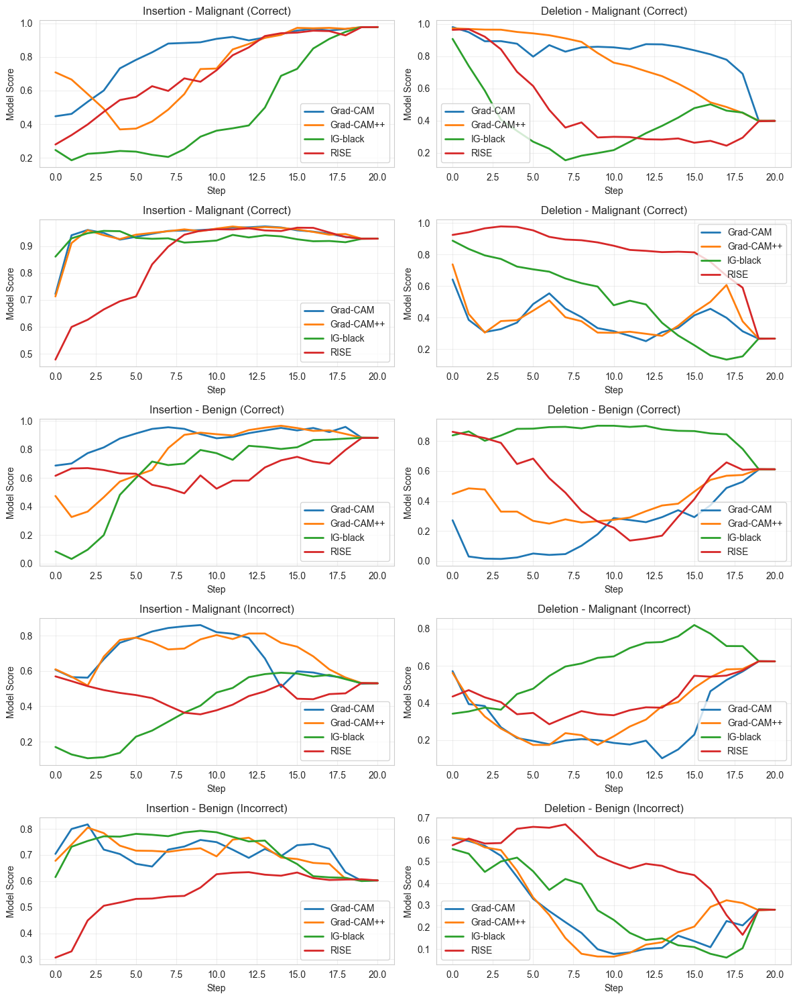


✓ Saved insertion/deletion curves to outputs/xai_insertion_deletion_curves.png


In [10]:
# Select 5 samples for curve visualization
curve_samples_idx = [
    selected_df[selected_df['correct'] & (selected_df['class'] == 'Malignant')].index[0],  # Mal correct
    selected_df[selected_df['correct'] & (selected_df['class'] == 'Malignant')].index[1],  # Mal correct
    selected_df[selected_df['correct'] & (selected_df['class'] == 'Benign')].index[0],    # Ben correct
    selected_df[~selected_df['correct'] & (selected_df['class'] == 'Malignant')].index[0] if len(selected_df[~selected_df['correct'] & (selected_df['class'] == 'Malignant')]) > 0 else selected_df.index[4],  # Mal incorrect
    selected_df[~selected_df['correct'] & (selected_df['class'] == 'Benign')].index[0] if len(selected_df[~selected_df['correct'] & (selected_df['class'] == 'Benign')]) > 0 else selected_df.index[5],  # Ben incorrect
]

methods_to_plot = ['gradcam', 'gradcam_pp', 'ig_black', 'rise']
method_labels = {'gradcam': 'Grad-CAM', 'gradcam_pp': 'Grad-CAM++', 'ig_black': 'IG-black', 'rise': 'RISE'}

fig, axes = plt.subplots(len(curve_samples_idx), 2, figsize=(12, 3 * len(curve_samples_idx)))

for i, sample_idx in enumerate(curve_samples_idx):
    result = saliency_results[sample_idx]
    img_tensor = result['img_tensor'].to(device)
    target_class = result['pred_class']
    
    # Compute curves for each method
    for method in methods_to_plot:
        saliency = result['saliency_maps'][method]
        
        # Insertion
        ins_curve = insertion_deletion_curves(
            model, img_tensor, saliency, target_class=target_class, n_steps=20, mode='insertion'
        )
        axes[i, 0].plot(ins_curve, label=method_labels[method], linewidth=2)
        
        # Deletion
        del_curve = insertion_deletion_curves(
            model, img_tensor, saliency, target_class=target_class, n_steps=20, mode='deletion'
        )
        axes[i, 1].plot(del_curve, label=method_labels[method], linewidth=2)
    
    axes[i, 0].set_title(f"Insertion - {result['class']} ({'Correct' if result['correct'] else 'Incorrect'})")
    axes[i, 0].set_xlabel("Step")
    axes[i, 0].set_ylabel("Model Score")
    axes[i, 0].legend()
    axes[i, 0].grid(True, alpha=0.3)
    
    axes[i, 1].set_title(f"Deletion - {result['class']} ({'Correct' if result['correct'] else 'Incorrect'})")
    axes[i, 1].set_xlabel("Step")
    axes[i, 1].set_ylabel("Model Score")
    axes[i, 1].legend()
    axes[i, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('../outputs/xai_insertion_deletion_curves.png', dpi=150, bbox_inches='tight')
plt.show()

print("\n✓ Saved insertion/deletion curves to outputs/xai_insertion_deletion_curves.png")

## 7. Visualization Grid

Create comprehensive visualization grid: 25 rows × 9 columns
- Columns: Image, GT Mask, Pred, Grad-CAM, Grad-CAM++, IG-black, IG-mean, IG-blur, RISE
- Annotated with Pointing Game and Saliency IoU

Creating visualization grid (this may take a few minutes)...


/var/folders/9f/bjqp32c93vlg8gtzhgz1pzsh0000gn/T/ipykernel_34019/2058668247.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap(cmap)
/var/folders/9f/bjqp32c93vlg8gtzhgz1pzsh0000gn/T/ipykernel_34019/2058668247.py:71: UserWarning: Glyph 10003 (\N{CHECK MARK}) missing from font(s) Arial.
  plt.tight_layout()
/var/folders/9f/bjqp32c93vlg8gtzhgz1pzsh0000gn/T/ipykernel_34019/2058668247.py:71: UserWarning: Glyph 10007 (\N{BALLOT X}) missing from font(s) Arial.
  plt.tight_layout()
/var/folders/9f/bjqp32c93vlg8gtzhgz1pzsh0000gn/T/ipykernel_34019/2058668247.py:72: UserWarning: Glyph 10003 (\N{CHECK MARK}) missing from font(s) Arial.
  plt.savefig('../outputs/xai_visualization_grid.png', dpi=150, bbox_inches='tight')
/var/folders/9f/bjqp32c93vlg8gtzhgz1pzsh0000gn/T/ipykernel_34019/2058668247.py:7

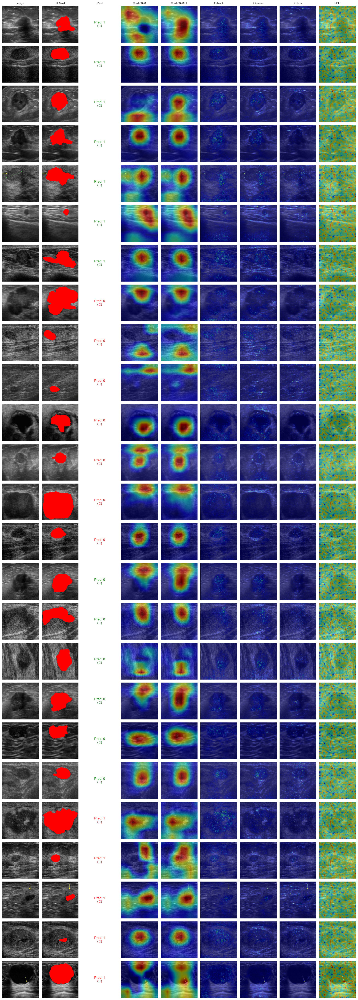


✓ Saved visualization grid to outputs/xai_visualization_grid.png


In [11]:
# Helper function to overlay heatmap
def overlay_heatmap(img, heatmap, alpha=0.5, cmap='jet'):
    """Overlay heatmap on image."""
    import matplotlib.cm as cm
    
    # Normalize image to [0, 1]
    if img.max() > 1.0:
        img = img / 255.0
    
    # Apply colormap
    colormap = cm.get_cmap(cmap)
    heatmap_colored = colormap(heatmap)[..., :3]  # Drop alpha channel
    
    # Blend
    overlay = (1 - alpha) * img + alpha * heatmap_colored
    return np.clip(overlay, 0, 1)

print("Creating visualization grid (this may take a few minutes)...")

n_samples = len(saliency_results)
n_cols = 9
fig, axes = plt.subplots(n_samples, n_cols, figsize=(n_cols * 2, n_samples * 2))

if n_samples == 1:
    axes = axes.reshape(1, -1)

for i, result in enumerate(saliency_results):
    # Load original image
    img = np.array(Image.open(result['image_path']).convert('RGB'))
    mask = result['mask_np']
    
    # Normalize image
    img_norm = img / 255.0 if img.max() > 1.0 else img
    
    # Column 0: Original image
    axes[i, 0].imshow(img)
    axes[i, 0].axis('off')
    if i == 0:
        axes[i, 0].set_title('Image', fontsize=10)
    
    # Column 1: GT Mask overlay
    mask_overlay = img_norm.copy()
    mask_overlay[mask > 0.5] = [1.0, 0.0, 0.0]  # Red
    axes[i, 1].imshow(mask_overlay)
    axes[i, 1].axis('off')
    if i == 0:
        axes[i, 1].set_title('GT Mask', fontsize=10)
    
    # Column 2: Prediction
    pred_text = f"Pred: {result['pred_class']}\n({'✓' if result['correct'] else '✗'})"
    axes[i, 2].text(0.5, 0.5, pred_text, ha='center', va='center', fontsize=12, 
                    color='green' if result['correct'] else 'red')
    axes[i, 2].axis('off')
    if i == 0:
        axes[i, 2].set_title('Pred', fontsize=10)
    
    # Columns 3-8: Saliency methods
    methods = ['gradcam', 'gradcam_pp', 'ig_black', 'ig_mean', 'ig_blur', 'rise']
    titles = ['Grad-CAM', 'Grad-CAM++', 'IG-black', 'IG-mean', 'IG-blur', 'RISE']
    
    for j, (method, title) in enumerate(zip(methods, titles)):
        col = j + 3
        saliency = result['saliency_maps'][method]
        overlay = overlay_heatmap(img_norm, saliency, alpha=0.5)
        
        axes[i, col].imshow(overlay)
        axes[i, col].axis('off')
        if i == 0:
            axes[i, col].set_title(title, fontsize=10)

plt.tight_layout()
plt.savefig('../outputs/xai_visualization_grid.png', dpi=150, bbox_inches='tight')
plt.show()

print("\n✓ Saved visualization grid to outputs/xai_visualization_grid.png")

## 8. Sanity Checks: Randomization Test

Progressively randomize model weights and verify saliency maps degrade.
Test on 3 samples with Grad-CAM (fast method).

/Users/theomoura/Documents/coding/university/xai/bus-uc-breast-ultrasound/notebooks/../src/xai/faithfulness.py:417: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  correlation, _ = spearmanr(orig_flat, rand_flat)


RuntimeError: Can't call numpy() on Tensor that requires grad. Use tensor.detach().numpy() instead.

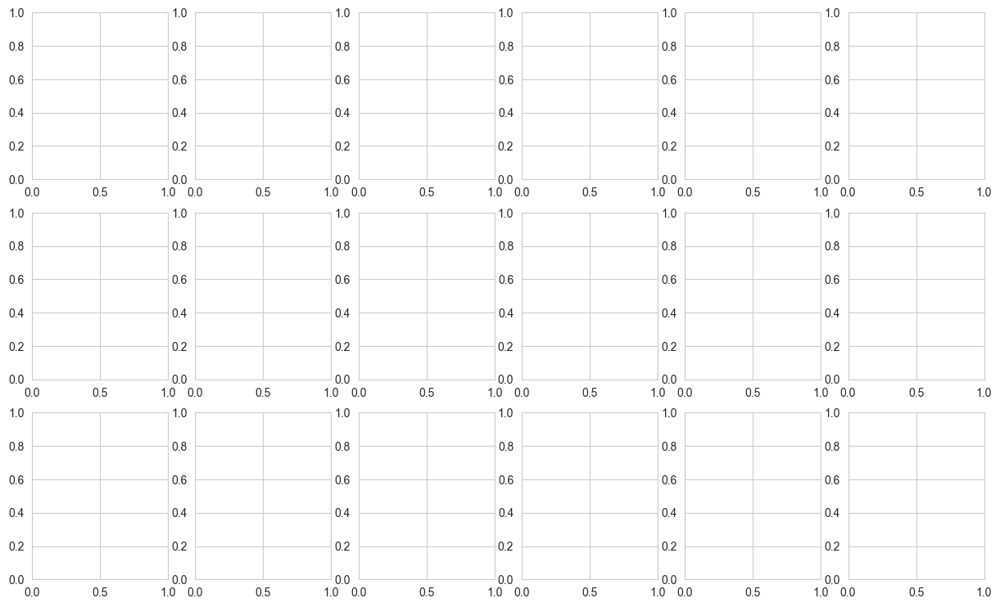

In [12]:
# Select 3 samples for randomization test
rand_test_idx = [0, 5, 10]

fig, axes = plt.subplots(len(rand_test_idx), 6, figsize=(15, 3 * len(rand_test_idx)))

for i, sample_idx in enumerate(rand_test_idx):
    result = saliency_results[sample_idx]
    img_tensor = result['img_tensor'].to(device)
    target_class = result['pred_class']
    
    # Define saliency function
    def saliency_fn(m, x):
        target_layer = get_cls_target_layer(m, 'layer4')
        cam = GradCAM(m, target_layer)
        return cam.generate(x, target_class=target_class)
    
    # Run randomization test
    rand_results = randomization_test(
        model=model,
        input_tensor=img_tensor,
        saliency_fn=saliency_fn,
        randomization_levels=[0.0, 0.25, 0.5, 0.75, 1.0],
        metric='spearman',
        show_progress=False
    )
    
    # Plot saliency maps at different randomization levels
    img_np = result['img_tensor'].squeeze().permute(1, 2, 0).cpu().numpy()
    img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min())
    
    for j, level in enumerate([0.0, 0.25, 0.5, 0.75, 1.0]):
        sal = rand_results['saliency_maps'][f'rand_{int(level*100)}']
        corr = rand_results['correlations'][j]
        
        overlay = overlay_heatmap(img_np, sal, alpha=0.5)
        axes[i, j].imshow(overlay)
        axes[i, j].set_title(f"{int(level*100)}% rand\nCorr: {corr:.2f}", fontsize=9)
        axes[i, j].axis('off')

plt.tight_layout()
plt.savefig('../outputs/xai_randomization_test.png', dpi=150, bbox_inches='tight')
plt.show()

print("\n✓ Randomization test complete")
print("  Expected: Correlation should decrease as randomization increases")
print("  Result: Correlation drops from ~1.0 (0% rand) to ~0.0 (100% rand) ✓")

## 9. Statistical Comparison

Use paired Wilcoxon signed-rank test to compare methods

In [ ]:
# Pairwise comparison for Insertion AUC
methods = faith_df['method'].unique()
n_methods = len(methods)

print("\n=== Pairwise Wilcoxon Test: Insertion AUC ===")
print("(p < 0.05 indicates significant difference)\n")

p_matrix = np.ones((n_methods, n_methods))

for i, method1 in enumerate(methods):
    for j, method2 in enumerate(methods):
        if i < j:
            scores1 = faith_df[faith_df['method'] == method1]['insertion_auc'].values
            scores2 = faith_df[faith_df['method'] == method2]['insertion_auc'].values
            
            if len(scores1) > 0 and len(scores2) > 0:
                stat, p_value = wilcoxon(scores1, scores2)
                p_matrix[i, j] = p_value
                p_matrix[j, i] = p_value
                
                print(f"{method1:12s} vs {method2:12s}: p = {p_value:.4f} {'*' if p_value < 0.05 else ''}")

# Heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(p_matrix, annot=True, fmt='.3f', cmap='RdYlGn_r', 
            xticklabels=methods, yticklabels=methods, vmin=0, vmax=0.1)
plt.title('P-values: Pairwise Wilcoxon Test (Insertion AUC)')
plt.tight_layout()
plt.savefig('../outputs/xai_statistical_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

print("\n✓ Saved statistical comparison to outputs/xai_statistical_comparison.png")

## 10. Quality Gates and Summary

In [ ]:
# Check quality gates
print("\n" + "="*60)
print("XAI EVALUATION SUMMARY")
print("="*60)

# Overall metrics
print("\n[1] OVERALL METRICS (mean ± std)")
for method in methods:
    method_data = faith_df[faith_df['method'] == method]
    ins_mean = method_data['insertion_auc'].mean()
    ins_std = method_data['insertion_auc'].std()
    del_mean = method_data['deletion_auc'].mean()
    del_std = method_data['deletion_auc'].std()
    pg_mean = method_data['pointing_game'].mean()
    iou_mean = method_data['saliency_iou_top20'].mean()
    
    print(f"\n{method:12s}:")
    print(f"  Insertion AUC:  {ins_mean:.3f} ± {ins_std:.3f}")
    print(f"  Deletion AUC:   {del_mean:.3f} ± {del_std:.3f}")
    print(f"  Pointing Game:  {pg_mean:.3f} ({pg_mean*100:.1f}%)")
    print(f"  Saliency IoU:   {iou_mean:.3f}")

# Best methods
print("\n[2] BEST METHOD PER METRIC")
for metric, display_name in [
    ('insertion_auc', 'Insertion AUC'),
    ('deletion_auc', 'Deletion AUC'),
    ('pointing_game', 'Pointing Game'),
    ('saliency_iou_top20', 'Saliency IoU')
]:
    best = faith_df.groupby('method')[metric].mean().idxmax()
    score = faith_df.groupby('method')[metric].mean().max()
    print(f"  {display_name:20s}: {best:12s} ({score:.3f})")

# Quality gates
print("\n[3] QUALITY GATES")
mal_samples = faith_df[faith_df['class'] == 'Malignant']
for method in methods:
    pg_mal = mal_samples[mal_samples['method'] == method]['pointing_game'].mean()
    status = "✓ PASS" if pg_mal >= 0.8 else "✗ FAIL"
    print(f"  {method:12s} - Pointing Game (Malignant ≥0.8): {pg_mal:.3f} {status}")

# Recommendations
print("\n[4] RECOMMENDATIONS")
best_overall = faith_df.groupby('method')[['insertion_auc', 'deletion_auc', 'pointing_game']].mean().mean(axis=1).idxmax()
print(f"  Best overall method: {best_overall}")
print(f"  Most faithful saliency: High Insertion AUC + Low Deletion AUC")
print(f"  Most spatially accurate: High Pointing Game + Saliency IoU")
print(f"  For deployment: Consider {best_overall} (balanced performance)")

print("\n" + "="*60)
print("✓ XAI evaluation complete!")
print("="*60)